<font size='6'><b>Testing map-level quadratic bias model using Smoothed EPT</b></font>

# Initialize


In [6]:
import sys, os, h5py, bz2, pylab as plt, importlib, itertools, healpy as hp, warnings
from tqdm.auto import tqdm, trange
from collections import OrderedDict
from IPython.display import set_matplotlib_formats
import seaborn
from ipywidgets import interactive, fixed
set_matplotlib_formats('retina')
plt.style.use('dark_background')
# plt.style.use('default')
%pylab inline
%load_ext autoreload
%autoreload 2
if 'notebooks' in os.getcwd(): os.chdir('..')
print(os.getcwd())
import matplotlib as mpl
mpl.rcParams.update({"axes.grid" : True})
mpl.rcParams['axes.axisbelow'] = True
mpl.rcParams['grid.linestyle'] = '--'
mpl.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.turbo(np.linspace(0,1,8)))


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/Users/tomaszk/Archive/projects/220708_cosmogrid_paper/021_desc_rerun


/var/folders/96/4c5n4tpd02l_82z2ppsmr5_40000gn/T/ipykernel_7308/4119152225.py:7: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')
/Users/tomaszk/pyvenv/miniconda3/envs/ccl241119/lib/python3.12/site-packages/IPython/core/magics/pylab.py:166: UserWarning: pylab import has clobbered these variables: ['interactive', 'plt']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [7]:
%%html
<style>
.cell-output-ipywidget-background {
    background-color: transparent !important;
}
:root {
    --jp-widgets-color: var(--vscode-editor-foreground);
    --jp-widgets-font-size: var(--vscode-editor-font-size);
}  
</style>

In [8]:
import pyccl as ccl
import pyccl.nl_pt as pt
import pyccl.ccllib as lib
import healpy as hp


In [9]:
import os, sys

class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

# Helpers

In [10]:
def write_to_pickle(filepath, obj):

    import pickle
    from xopen import xopen
    with xopen(filepath, mode="wb", threads=0, compresslevel=5) as f:
        pickle.dump(obj, f)


def read_from_pickle(filepath):

    import pickle
    from xopen import xopen
    with xopen(filepath, mode="rb") as f:
        obj = pickle.load(f)

    return obj

# Load data

The file contains the baryonified and unbaryonified shells.

In [11]:
fname_shells = './processed/v11/CosmoGrid/bary/fiducial/cosmo_fiducial/run_0000/baryonified_shells_v11.h5'

In [163]:
with h5py.File(fname_shells, 'r') as f:
    print(np.array(f['sim_params'])['As'].shape)


(33,)


# Load nz and kernels

The projection weights are stored in a pickle file, precomputed for the fiducial cosmology.

In [229]:
n_bins = 4
nz = read_from_pickle('proj_weights.pkl')['nz']
ker = read_from_pickle('proj_weights.pkl')['ker']

## Create n(z) for shells - will be useful later

In [230]:
sys.path.append('/Users/tomaszk/Archive/projects/220708_cosmogrid_paper/021_desc_rerun/repos/cosmogridv11/')
sys.path.append('/Users/tomaszk/Archive/projects/220708_cosmogrid_paper/021_desc_rerun/repos/UFalcon/')
from cosmogridv11 import utils_cosmogrid
shell_info = utils_cosmogrid.get_simulations_list(set_type='fiducial')[2]
z_bounds = shell_info['CosmoGrid/raw/fiducial/cosmo_fiducial/']
z_mean = (z_bounds['lower_z'] + z_bounds['upper_z'])/2


In [287]:
from scipy.interpolate import interp1d
shells_nz = []
shells_nz_sqrt = []
for nz_ in nz:
    z_ = np.concatenate([[0], nz_[:,0]])
    n_ = np.concatenate([[0], nz_[:,1]])
    f = interp1d(z_, np.cumsum(n_/np.sum(n_)), kind='cubic', fill_value=1, bounds_error=False)
    nz_shell = f(z_bounds['upper_z']) - f(z_bounds['lower_z'])
    shells_nz.append(nz_shell)



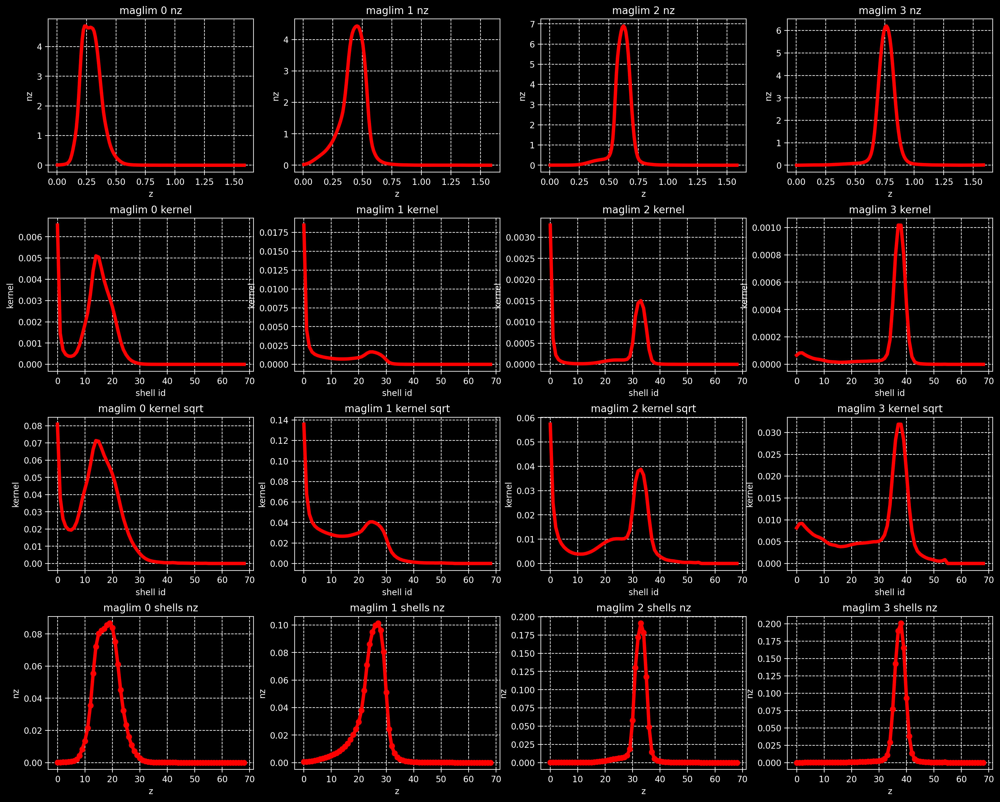

In [289]:
nx, ny = 4, len(nz); figsize=4; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
for i in range(n_bins):
    ax[0,i].plot(nz[i][:,0],nz[i][:,1], c='r', lw='4')
    ax[0,i].set(title=f'maglim {i} nz', xlabel='z', ylabel='nz')
    ax[1,i].plot(ker[i], c='r', lw='4')
    ax[1,i].set(title=f'maglim {i} kernel', xlabel='shell id', ylabel='kernel')
    ax[2,i].plot(np.sqrt(ker[i]), c='r', lw='4')
    ax[2,i].set(title=f'maglim {i} kernel sqrt', xlabel='shell id', ylabel='kernel')
    ax[3,i].plot(shells_nz[i], c='r', lw='4', marker='o')
    ax[3,i].set(title=f'maglim {i} shells nz', xlabel='z', ylabel='nz')
fig.subplots_adjust(hspace=0.3)
plt.show()


# Load maps

In [290]:
def load_shell(fname, shell_id):

    with h5py.File(fname, 'r') as f:
        m = np.array(f['nobaryon_shells'][f'shell{shell_id:03d}'])
        return m
    

In [291]:
def plot_maps(ms, lims=[0,100], titles=None):

    if titles is None:
        titles = ['']*len(ms)

    nx, ny = 1, len(ms); figsize=4; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
    for i, m in enumerate(ms):
        plt.axes(axl[i])
        vmin, vmax = np.percentile(m, lims)        
        hp.orthview(m, hold=True, half_sky=True, bgcolor='black', badcolor='grey', cmap='plasma', min=vmin, max=vmax, title=titles[i])
    plt.show()


In [292]:
ms = [load_shell(fname_shells, i) for i in [10,30,50]]

Plot sqrt(map) in order to see the maps better

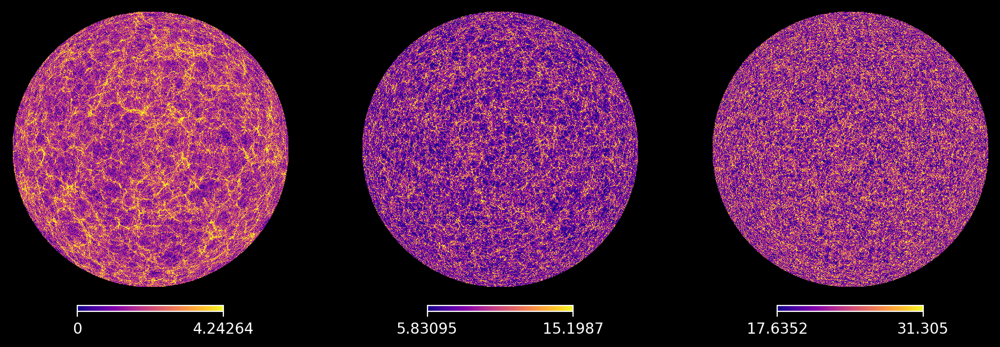

In [293]:
plot_maps([np.sqrt(s) for s in ms], lims=[5,95])

# Linear PT, linear bias


## Project with weights

The weights are computed so that the projected maps can be created by simply summing the shells with the weights.

In [294]:
# the main projection function, can be modified to use sqrt(weight) for creating the quad maps
def projection_clustering_lin(fname_shells, ker_zsamp, shells_nz, tag='', nside=1024):
    
    m = np.zeros(hp.nside2npix(nside))
    for i, w in tqdm(list(enumerate(ker_zsamp)), desc=f'projecting shells zsamp={tag}'):
        s = load_shell(fname_shells, i)

        w_lin = ker_zsamp[i]
        w_δ = shells_nz[i]

        if w_lin<1e-14:
            continue

        # convert to delta as in https://arxiv.org/abs/0711.1540 eqn 5
        s_lin = s/w_lin
        δ_current = (s_lin - np.mean(s_lin))/np.mean(s_lin)
        m += δ_current * w_δ


    return m    
    

Project the linear bias maps with the weights

In [295]:
ms_lin = []
for i_zsamp, ker_zsamp in enumerate(ker):
    ms_lin.append( projection_clustering_lin(fname_shells, ker[i_zsamp], shells_nz[i_zsamp], tag=i_zsamp) )

projecting shells zsamp=0:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells zsamp=1:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells zsamp=2:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells zsamp=3:   0%|          | 0/69 [00:00<?, ?it/s]

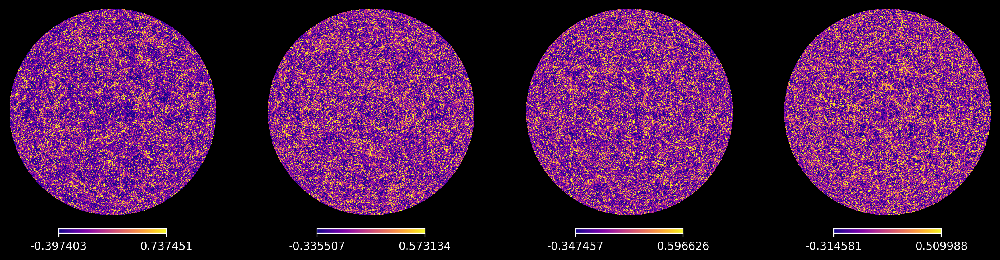

In [296]:
plot_maps(ms_lin, lims=[5,95])

## Compute $C_ℓ$ of maps

In [297]:
def compute_cell(ms):
    cs = []
    for m in tqdm(ms):
        cs.append( hp.alm2cl(hp.map2alm(m)) )

    return cs

In [357]:
def plot_cells(cs, color='hotpink', tags=None, xlim=None, axl=None, scaled=True):

    if tags is None:
        tags = [str(i) for i in range(len(cs))]

    if axl is None:
        nx, ny = 1, len(cs); figsize=4; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
        
    for i, c in enumerate(cs):
        ℓ = np.arange(len(c))
        if scaled:
            axl[i].plot(ℓ, c*ℓ*(ℓ+1)/np.pi/2, c=color, label=tags[i])
        else:
            axl[i].plot(ℓ, c, c=color, label=tags[i])
        axl[i].set(xlim=xlim, xlabel='$\\ell$')
        axl[i].legend()
        
    return axl

In [299]:
cs_lin_map = compute_cell(ms_lin);
xlim = [0, 1000]

  0%|          | 0/4 [00:00<?, ?it/s]

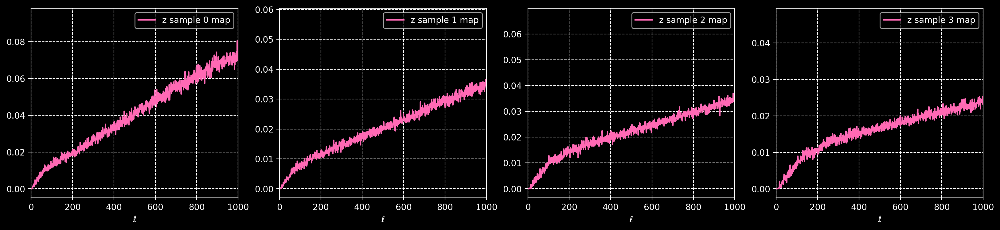

In [300]:
plot_cells(cs_lin_map, tags=[f'z sample {i} map' for i in range(len(cs_lin_map))], xlim=xlim)
plt.show()

## Get EPT angular power spectra

Get the $C_ℓ$ that corresponds to the maps using PyCCL. Prescription from Andrina and Virginia.

In [301]:
ell_theory = np.unique(np.geomspace(2,10260,10010).astype(int)).astype(float)

In [302]:
def get_ept_cl(nz, b1, b2, bs,  **fastpt_args):

    defaults = dict(log10k_min=-4, log10k_max=4, nk_per_decade=100, k_cutoff=10000, sub_lowk=False, C_window=0.75, P_window=[0.2, 0.2])
    fastpt_args = defaults | fastpt_args

    n_bins = len(nz)
    assert len(b1) == n_bins
    assert len(b2) == n_bins
    assert len(bs) == n_bins
    
    #Build number counts tracer
    # Number counts
    ptc = pt.EulerianPTCalculator(**fastpt_args, with_NC=True)
    ptc.update_ingredients(cosmo)
    cls = []
    for i in trange(n_bins):
        nz_ = nz[i]
        ptg = pt.PTNumberCountsTracer(b1=b1[i], b2=b2[i], bs=bs[i])
        pk_gg = ptc.get_biased_pk2d(ptg)
        t_g = ccl.NumberCountsTracer(cosmo, has_rsd=False, dndz=(nz_[:,0], nz_[:,1]), bias=(nz_[:,0], np.ones_like(nz_[:,0])), mag_bias=None)
        cls_ept = ccl.angular_cl(cosmo, t_g, t_g, ell_theory, p_of_k_a=pk_gg)
        cls = cls + [cls_ept]
        
    return cls

In [303]:
#read cosmo params
metainfo = np.load('metainfo_perms.npy')

In [304]:
# create cosmo object
As = metainfo[0]['As']
Omega_c = metainfo[0]['O_cdm']
Omega_b = metainfo[0]['Ob']
h = metainfo[0]['H0']/100
n_s = metainfo[0]['ns']
cosmo = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, h=h, A_s=As, n_s=n_s, Neff=3.15, m_nu=0.06)

In [305]:
# create $C_ℓ$ using PyCCL
b1 = np.ones(len(nz))
b2 = np.zeros(len(nz))
bs = np.zeros(len(nz))
cs_lin_ept = get_ept_cl(nz, b1, b2, bs)

Warning, you selected a extrap_high that is less than k_max. Therefore no extrapolation will be done.


  0%|          | 0/4 [00:00<?, ?it/s]

Compare the $C_ℓ$ from the maps and the $C_ℓ$ from the EPT.

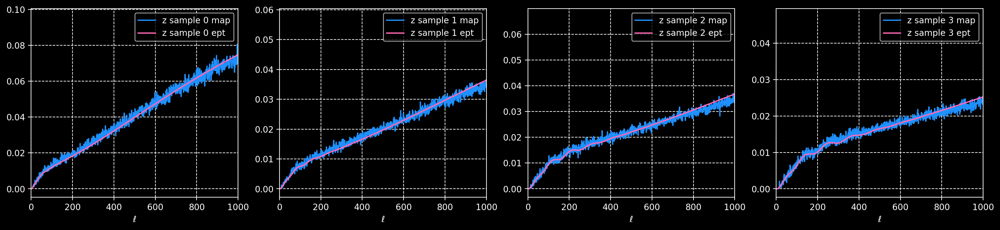

In [306]:
ax = plot_cells(cs_lin_map, tags=[f'z sample {i} map' for i in range(len(cs_lin_map))], xlim=xlim, color='dodgerblue')
ax = plot_cells(cs_lin_ept, tags=[f'z sample {i} ept' for i in range(len(cs_lin_ept))], xlim=xlim, axl=ax, color='hotpink')
plt.show()

# Smoothed EPT

Smoothed EPT is a modification of the EPT that includes a cutoff factor in the $O(2)$ term, but only fo the quadratic b2 and bs bias terms.

In smoothed EPT, the ept_O2_k_cutoff is a physical scale, so it should be varying with redshift. 
It should be recalculated for each z in EPT calculation. 
Here I am using a constant ept_O2_k_cutoff, but that should be modified.


In [307]:
# subclass EulerianPTCalculator, cut off the higher order terms
# see https://github.com/jablazek/FAST-PT/blob/master/docs/usr_manual.pdf equation 3
# and PyCCL:
# https://github.com/LSSTDESC/CCL/blob/406b54888b8a0f8af58f5fcff714afcb2114f7c2/pyccl/nl_pt/ept.py#L305
from  pyccl.nl_pt.ept import EulerianPTCalculator
class SmoothedEulerianPTCalculator(EulerianPTCalculator):

    def __init__(self, *args, ept_O2_k_cutoff=None, **kwargs):

        self.ept_O2_k_cutoff = ept_O2_k_cutoff
        super().__init__(*args, **kwargs)
       
    
    def update_ingredients(self, cosmo):      

        super().update_ingredients(cosmo)
        
        # Cutoff factor
        if self.ept_O2_k_cutoff is not None:
            ept_O2_k_cutoff = np.exp(-(self.k_s/self.ept_O2_k_cutoff)**2)
            ept_O2_k_cutoff = ept_O2_k_cutoff[None, :]
        else:
            ept_O2_k_cutoff = 1

        self.dd_bias = list(self.dd_bias)
        self.dd_bias[2] = self.dd_bias[2] * ept_O2_k_cutoff
        self.dd_bias[3] = self.dd_bias[3] * ept_O2_k_cutoff**2


In [308]:
def get_ept_pk_interps(b1, b2, bs=0, **kw):

    defaults = dict(log10k_min=-4, log10k_max=4, nk_per_decade=100, k_cutoff=10000, sub_lowk=False, C_window=0.75, P_window=[0.2, 0.2])
    kw = defaults | kw

    ptt_g = pt.PTNumberCountsTracer(b1=b1, b2=b2, bs=bs)
    ptc = SmoothedEulerianPTCalculator(cosmo=cosmo, with_NC=True, with_IA=False, **kw)
    pk_gg = ptc.get_biased_pk2d(ptt_g)
    
    return pk_gg

In [309]:
def get_ept_cl_smoothed(nz, b1, b2, bs, ept_O2_k_cutoff, verb=False, **fastpt_args):

    n_bins = len(nz)
    assert len(b1) == n_bins
    assert len(b2) == n_bins
    assert len(bs) == n_bins

    defaults = dict(log10k_min=-4, log10k_max=4, nk_per_decade=100, k_cutoff=10000, sub_lowk=False, C_window=0.75, P_window=[0.2, 0.2])
    fastpt_args = defaults | fastpt_args

    if verb:
        print('fastpt_args', fastpt_args)
        print('b1', b1)
        print('b2', b2)
        print('bs', bs)
        print('ept_O2_k_cutoff', ept_O2_k_cutoff)
    
    cls = ()
    for i in range(n_bins):

        nz_ = nz[i]

        with HiddenPrints():
            pk_gg_smoothed_ept = get_ept_pk_interps(b1[i], b2[i], bs[i], ept_O2_k_cutoff=ept_O2_k_cutoff, **fastpt_args)
            pk_gg_smoothed_lin = get_ept_pk_interps(b1[i], b2=0, bs=0, ept_O2_k_cutoff=ept_O2_k_cutoff, **fastpt_args)
            pk_gg_lin = get_ept_pk_interps(b1[i], b2=0, bs=0, ept_O2_k_cutoff=None, **fastpt_args)


        t_g = ccl.NumberCountsTracer(cosmo, has_rsd=False, dndz=(nz_[:,0], nz_[:,1]), bias=(nz_[:,0], np.ones_like(nz_[:,0])), mag_bias=None)

        cls_smoothed_ept    = ccl.angular_cl(cosmo, t_g, t_g, ell_theory, p_of_k_a=pk_gg_smoothed_ept)
        cls_smoothed_lin    = ccl.angular_cl(cosmo, t_g, t_g, ell_theory, p_of_k_a=pk_gg_smoothed_lin)
        cls_lin             = ccl.angular_cl(cosmo, t_g, t_g, ell_theory, p_of_k_a=pk_gg_lin)

        cls_sept = cls_smoothed_ept - cls_smoothed_lin + cls_lin

        cls = cls + ((cls_sept, cls_lin),)
        
    return cls

In [310]:
b1 = [1]*4
b2 = [0.2]*4
bs = [0]*4

fastpt_args {'log10k_min': -4, 'log10k_max': 4, 'nk_per_decade': 100, 'k_cutoff': 10000, 'sub_lowk': False, 'C_window': 0.75, 'P_window': [0.2, 0.2]}
b1 [1, 1, 1, 1]
b2 [0.2, 0.2, 0.2, 0.2]
bs [0, 0, 0, 0]
ept_O2_k_cutoff 1


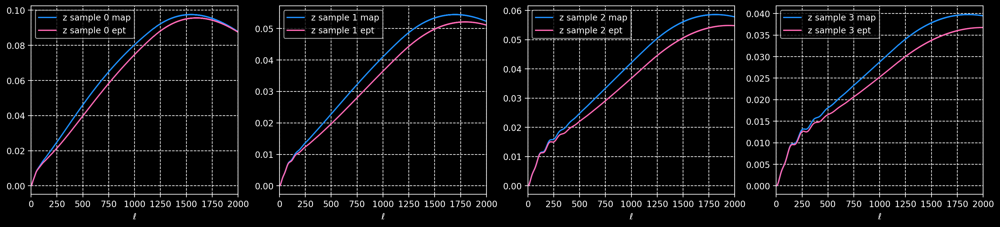

In [311]:
cs_all = get_ept_cl_smoothed(nz, b1, b2, bs, ept_O2_k_cutoff=1, verb=True)
cs_all = np.array(cs_all)
cs_ept = cs_all[:,0,:]
cs_lin = cs_all[:,1,:]
xlim = [0, 2000]
ax = plot_cells(cs_ept, tags=[f'z sample {i} map' for i in range(n_bins)], xlim=xlim, color='dodgerblue')
ax = plot_cells(cs_lin, tags=[f'z sample {i} ept' for i in range(n_bins)], xlim=xlim, axl=ax, color='hotpink')
plt.show()


### Compare $C_ℓ$ for different ept_O2_k_cutoff

In [43]:
def plot_sept(ept_O2_k_cutoff):

    with HiddenPrints():
        cs_all = get_ept_cl_smoothed(nz, b1, b2, bs, ept_O2_k_cutoff=ept_O2_k_cutoff)
    cs_all = np.array(cs_all)
    cs_ept = cs_all[:,0,:]
    cs_lin = cs_all[:,1,:]
    xlim = [0, 2000]
    ax = plot_cells(cs_ept, tags=[f'z sample {i} map' for i in range(n_bins)], xlim=xlim, color='dodgerblue')
    ax = plot_cells(cs_lin, tags=[f'z sample {i} ept' for i in range(n_bins)], xlim=xlim, axl=ax, color='hotpink')
    for a in ax:
        a.set_title(f'ept_O2_k_cutoff={ept_O2_k_cutoff}')
    plt.show()


Now plot the cls for different ept_O2_k_cutoff

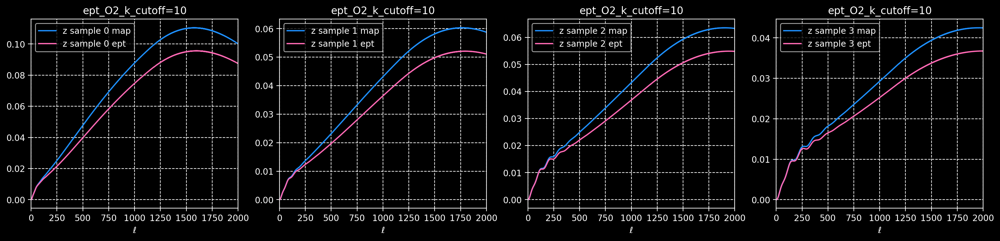

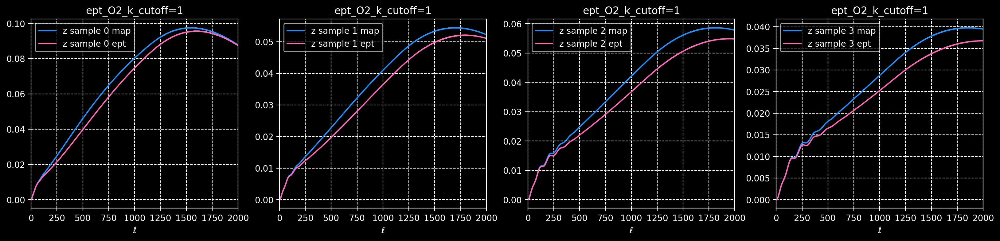

In [44]:
plot_sept(ept_O2_k_cutoff=10)
plot_sept(ept_O2_k_cutoff=1)

## Quadratic bias maps for smoothed EPT

### First create smoothed version of maps

In [101]:
n_maps = 69
smoothing_scales = np.full(69, 20) # arcmin, this has to be computed according to the angular diameter distance
fname_shells_smoothed = './processed/v11/CosmoGrid/bary/fiducial/cosmo_fiducial/run_0000/baryonified_shells_v11_smoothed.h5'
with h5py.File(fname_shells_smoothed, 'w') as f:
    for i in trange(n_maps, desc='smoothing maps'):
        s = load_shell(fname_shells, i)
        s_smooth = hp.smoothing(s, fwhm=np.radians(smoothing_scales[i]/60))
        f.create_dataset(f'nobaryon_shells/shell{i:03d}', data=s_smooth)
        f.attrs['smoothing_scale'] = smoothing_scales[i]


smoothing maps:   0%|          | 0/69 [00:00<?, ?it/s]

Plot the maps before and after smoothing

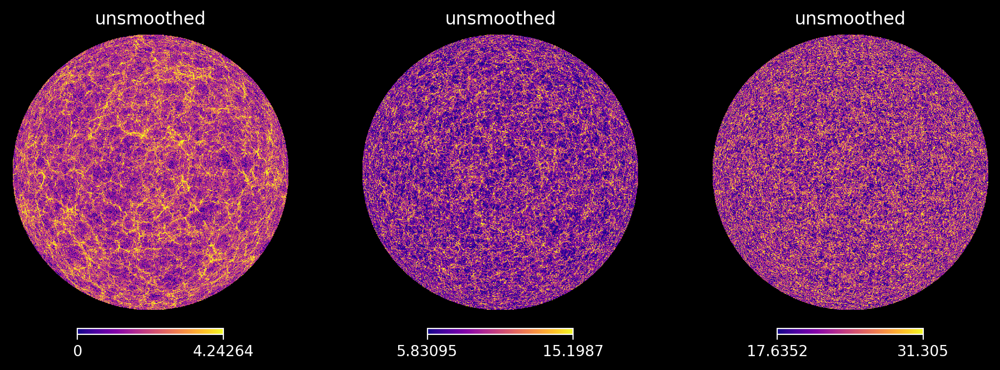

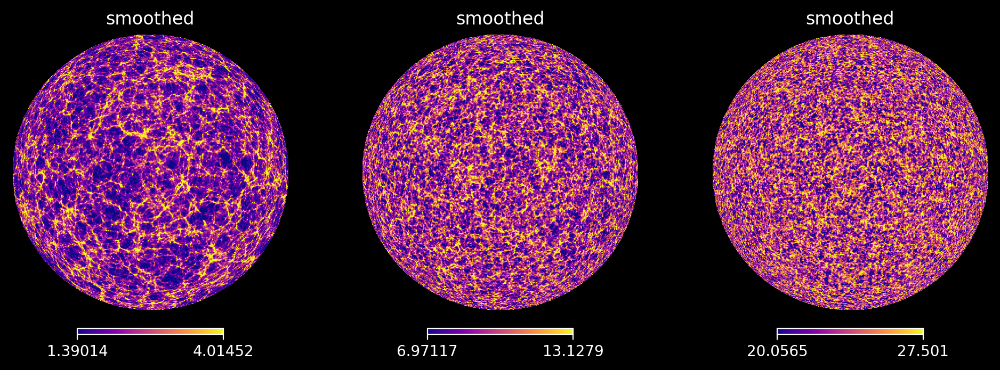

In [104]:
ms = [load_shell(fname_shells, i) for i in [10,30,50]]
ms_smoothed = [load_shell(fname_shells_smoothed, i) for i in [10,30,50]]
plot_maps(np.sqrt(np.array(ms)), lims=[5,95], titles=['unsmoothed']*3)
plot_maps(np.sqrt(np.array(ms_smoothed)), lims=[5,95], titles=['smoothed']*3)
plt.show()


### Projection

In [343]:
def plot_map_histograms(ms, bins=100,tags=None, title=None, yscale='linear'):
    nx, ny = 1, len(ms); figsize=3; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.2, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
    if tags is None:
        tags = [str(i) for i in range(len(ms))]
    for i, m in enumerate(ms):
        axl[i].hist(m, bins=bins, alpha=1, label=tags[i], color='dodgerblue')
        axl[i].axvline(np.mean(m),  lw=2, c='hotpink', label=f'mean {np.mean(m):.4e}')
        axl[i].set(title=title, xlabel='pixel value', ylabel='count', yscale=yscale)
        axl[i].legend()
    plt.show()

In [341]:
# the main projection function, can be modified to use sqrt(weight) for creating the quad maps
# this is where the main effort is needed
def projection_clustering_sept(fname_shells, smoothing_scales, shells_nz, ker_zsamp, b1, b2, nside=1024, tag=''):
    """
    Project the shells with the weights and smooth them with the smoothing scales.
    :param fname_shells: path to the shells file
    :param smoothing_scales: smoothing scales for the shells, same length as the number of shells, in arcmin
    :param shells_nz: n(z) for the shells, same length as the number of shells
    :param ker_zsamp: weights for the shells, same length as the number of shells
    :param b1: linear bias
    :param b2: quadratic bias
    :param nside: nside of the output map
    :param tag: tag for the output map
    :return: output map
    """

    n_shells = len(smoothing_scales)

    # initialize output map    
    m_lin = np.zeros(hp.nside2npix(nside))
    m_quad = np.zeros(hp.nside2npix(nside))

    # loop over shells
    for i in tqdm(range(n_shells), desc=f'projecting shells sept zsamp={tag}'):
        
        w_lin = ker_zsamp[i]
        w_δ = shells_nz[i]

        if w_lin<1e-14:
            continue
        
        # load shell and downgrade to nside
        s = load_shell(fname_shells, i)
        s_smooth = load_shell(fname_shells_smoothed, i)

        # linear bias
        # the caveat here is that the weights w in UFalcon are calculated without subtracting the w * \Delta_chi_b, as this term adds up to 1 and can be removed later
        # see https://www.overleaf.com/project/6656fd372fe6104be1779bd7 equation 2.20
        # and https://arxiv.org/abs/1801.05745 equation 2.2 

        # standard UFalcon projection
        # s_lin = s 
        # w_lin = w_lin  
        # m_lin += s_lin * w_lin 

        # convert to delta as in https://arxiv.org/abs/0711.1540 eqn 5
        s_lin = s/w_lin
        δ_current = (s_lin - np.mean(s_lin))/np.mean(s_lin)
        m_lin += δ_current * w_δ

        # quadratic bias
        s_quad = δ_current
        w_quad = np.sqrt(w_δ) # technically we shoul integrate sqrt(w_δ) over the shell, but this should be a good approximation
        m_quad += s_quad * w_quad 


    δ_lin = m_lin # lin map
    δ_quad = m_quad**2  # quad map
    δ = b1 * δ_lin + b2/2 * (δ_quad - np.mean(δ_quad)) # combined map

    return δ, m_lin, m_quad
    

Project the SEPT maps

In [320]:
δs_sept = []
ms_lin_sept = []
ms_quad_sept = []
nside_use = 1024 # Smoothing high resolution maps takes a long time, so it's best to use a lower resolution map for testing, target is 1024

ept_O2_k_cutoff = 1 # here one needs to calculate the ept_O2_k_cutoff for each z, so that it matches the physical scale in smoothing_scales
for i_zsamp, ker_zsamp in enumerate(ker):
    δ, m_lin, m_quad = projection_clustering_sept(fname_shells, 
                                    smoothing_scales=smoothing_scales,
                                    shells_nz=shells_nz[i_zsamp],
                                    ker_zsamp=ker[i_zsamp],
                                    nside=nside_use,
                                    b1=b1[i_zsamp],
                                    b2=b2[i_zsamp],
                                    tag=i_zsamp)
    δs_sept.append(δ)
    ms_lin_sept.append(m_lin)
    ms_quad_sept.append(m_quad)


projecting shells sept zsamp=0:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells sept zsamp=1:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells sept zsamp=2:   0%|          | 0/69 [00:00<?, ?it/s]

projecting shells sept zsamp=3:   0%|          | 0/69 [00:00<?, ?it/s]

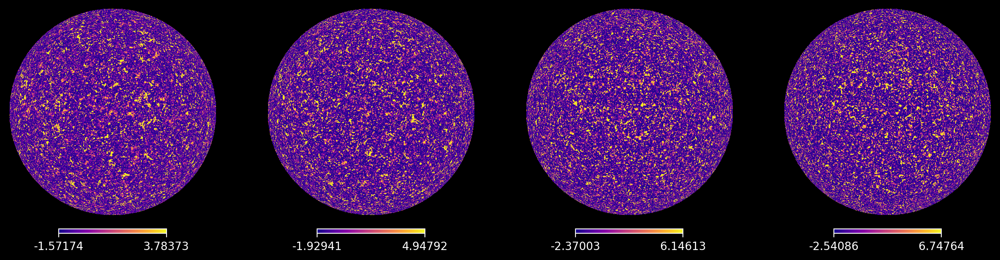

In [314]:
plot_maps(δs_sept, lims=[5,95])

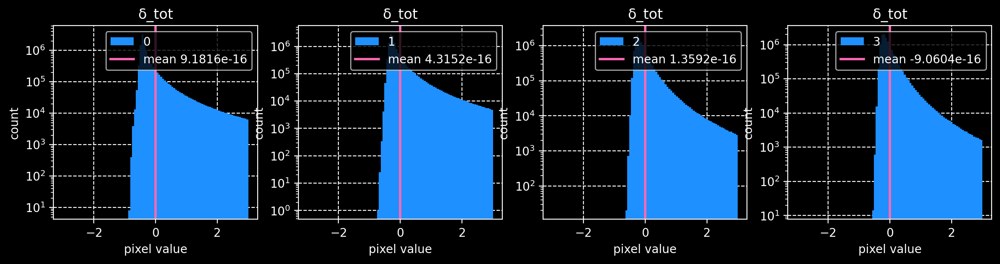

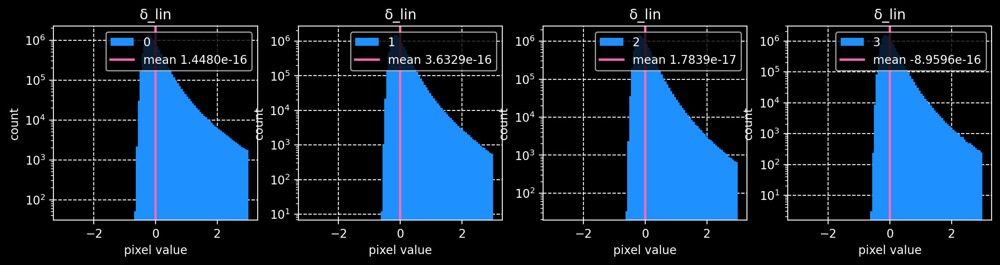

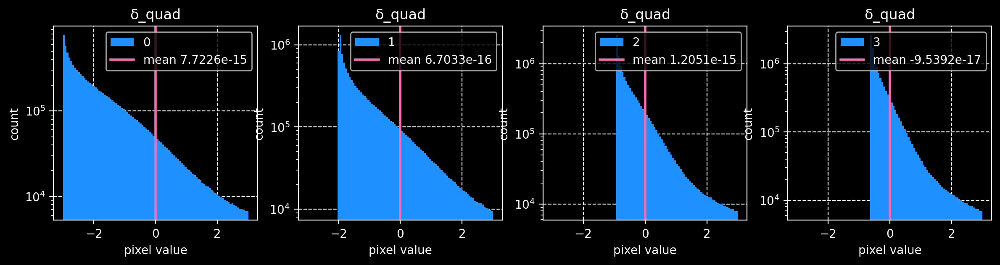

In [344]:
bins = np.linspace(-3,3,100)
plot_map_histograms(δs_sept, bins=bins, title='δ_tot', yscale='log' )
plot_map_histograms(ms_lin_sept, bins=bins, title='δ_lin', yscale='log')
plot_map_histograms([m**2 - np.mean(m**2) for m in ms_quad_sept], bins=bins, title='δ_quad', yscale='log')


## Compare $C_ℓ$ of maps and PyCCL SEPT


In [345]:
cs_δ_sept_map = compute_cell(δs_sept);

  0%|          | 0/4 [00:00<?, ?it/s]

In [346]:
cs_all = get_ept_cl_smoothed(nz, b1, b2, bs, ept_O2_k_cutoff=ept_O2_k_cutoff, verb=True) 
cs_all = np.array(cs_all)
cs_sept = cs_all[:,0,:]
cs_lin = cs_all[:,1,:]

fastpt_args {'log10k_min': -4, 'log10k_max': 4, 'nk_per_decade': 100, 'k_cutoff': 10000, 'sub_lowk': False, 'C_window': 0.75, 'P_window': [0.2, 0.2]}
b1 [1, 1, 1, 1]
b2 [0.2, 0.2, 0.2, 0.2]
bs [0, 0, 0, 0]
ept_O2_k_cutoff 1


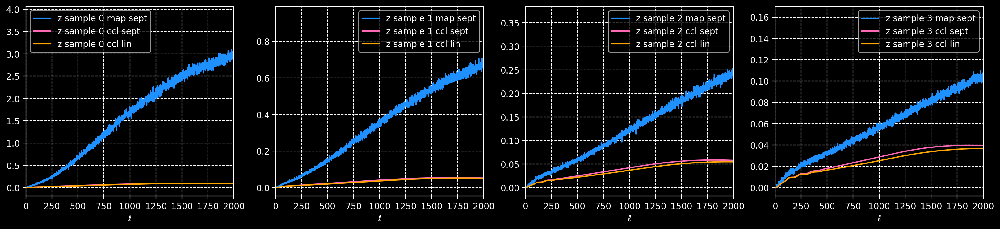

In [347]:
xlim = [0, 2000]
ax = plot_cells(cs_δ_sept_map, tags=[f'z sample {i} map sept' for i in range(n_bins)], xlim=xlim, color='dodgerblue')
ax = plot_cells(cs_sept, tags=[f'z sample {i} ccl sept' for i in range(n_bins)], xlim=xlim, axl=ax, color='hotpink')
ax = plot_cells(cs_lin, tags=[f'z sample {i} ccl lin' for i in range(n_bins)], xlim=xlim, axl=ax, color='orange')
plt.show()

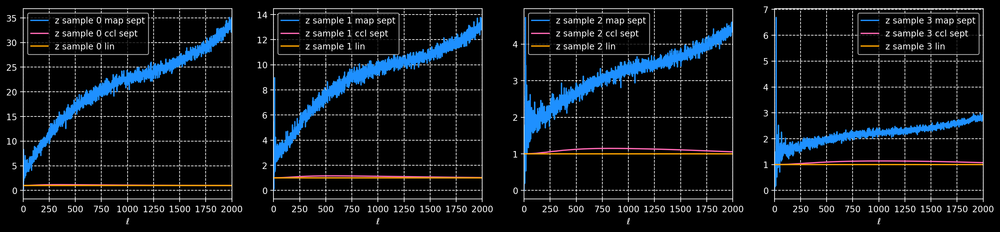

In [359]:
xlim = [0, 2000]
ell_max = 2000
ax = plot_cells([a[:ell_max]/b[:ell_max] for a,b in zip(cs_δ_sept_map, cs_lin)], 
                tags=[f'z sample {i} map sept' for i in range(n_bins)], xlim=xlim, color='dodgerblue', scaled=False)
ax = plot_cells([a[:ell_max]/b[:ell_max] for a,b in zip(cs_sept, cs_lin)], 
                 tags=[f'z sample {i} ccl sept' for i in range(n_bins)], xlim=xlim, axl=ax, color='hotpink', scaled=False )
ax = plot_cells([a[:ell_max]/b[:ell_max] for a,b in zip(cs_lin, cs_lin)], 
                 tags=[f'z sample {i} lin' for i in range(n_bins)], xlim=xlim, axl=ax, color='orange', scaled=False)
plt.show()

## Combine linear and quadratic bias maps

$\rightarrow$ the goal is to make these two $C_ℓ$ match, up to around ell=500.



